
Задание 3

1) Изучить на скрытые темы "Преступление и наказание"

2) Реализовать тематическое моделирование через кластеризацию и BERTopic(считается как одно)

3) Сравнить эффективность использования евклидова расстояния и 2 других типов расстояния в кластеризации

4) Визуализировать кластера по выделенным топикам

5) Выложить на github

# Инсталлы

In [126]:
! pip install gensim
! pip install bertopic
! pip install umap-learn
! pip install jieba


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


# Часть 0(предобработочка)

Попробуем обработать данные(каким бы потрясающим не был способ, данные нада почистить. там еще и ValueError: Transform unavailable when model was fit with only a single data sample.... Кто б знал, как эту красоту решать, будем думать), но сначала их прочитаем(оглавление и все, что не связано с текстом произведения я удалил вручную)

In [127]:
with open('Crime And Punishment.txt', 'r') as f:
    text_data = f.read().replace('I', '').replace('V', '')
text_data

'\n\nЧасть первая\n\n\n\n\n\n\n\n\n\nВ начале июля, в чрезвычайно жаркое время, под вечер один молодой человек вышел из своей каморки, которую нанимал от жильцов в С-м переулке, на улицу и медленно, как бы в нерешимости, отправился к К-ну мосту.\n\nОн благополучно избегнул встречи с своею хозяйкой на лестнице. Каморка его приходилась под самою кровлей высокого пятиэтажного дома и походила более на шкаф, чем на квартиру. Квартирная же хозяйка его, у которой он нанимал эту каморку с обедом и прислугой, помещалась одною лестницей ниже, в отдельной квартире, и каждый раз, при выходе на улицу, ему непременно надо было проходить мимо хозяйкиной кухни, почти всегда настежь отворенной на лестницу. И каждый раз молодой человек, проходя мимо, чувствовал какое-то болезненное и трусливое ощущение, которого стыдился и от которого морщился. Он был должен кругом хозяйке и боялся с нею встретиться.\n\nНе то чтоб он был так труслив и забит, совсем даже напротив; но с некоторого времени он был в раздраж

Давайте нарежем по предложениям(чтобы потом модельке было на чем учиться + предложение - отличный вариант для представления текста в виде набора смысловых единиц)

In [128]:
import nltk
nltk.download('punkt')


[nltk_data] Downloading package punkt to /home/ivzarru/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [129]:
def split_into_sentences(text):
    sentences = nltk.sent_tokenize(text)
    return sentences

In [130]:
sentences_data = split_into_sentences(text_data)
sentences_data

['\n\nЧасть первая\n\n\n\n\n\n\n\n\n\nВ начале июля, в чрезвычайно жаркое время, под вечер один молодой человек вышел из своей каморки, которую нанимал от жильцов в С-м переулке, на улицу и медленно, как бы в нерешимости, отправился к К-ну мосту.',
 'Он благополучно избегнул встречи с своею хозяйкой на лестнице.',
 'Каморка его приходилась под самою кровлей высокого пятиэтажного дома и походила более на шкаф, чем на квартиру.',
 'Квартирная же хозяйка его, у которой он нанимал эту каморку с обедом и прислугой, помещалась одною лестницей ниже, в отдельной квартире, и каждый раз, при выходе на улицу, ему непременно надо было проходить мимо хозяйкиной кухни, почти всегда настежь отворенной на лестницу.',
 'И каждый раз молодой человек, проходя мимо, чувствовал какое-то болезненное и трусливое ощущение, которого стыдился и от которого морщился.',
 'Он был должен кругом хозяйке и боялся с нею встретиться.',
 'Не то чтоб он был так труслив и забит, совсем даже напротив; но с некоторого време

Сделаем немного красоты, обернем в датафрейм

In [131]:
import pandas as pd

In [132]:
data = pd.DataFrame({'sentence': sentences_data})
data

,sentence
0,\n\nЧасть первая\n\n\n\n\n\n\n\n\n\nВ начале и...
1,Он благополучно избегнул встречи с своею хозяй...
2,Каморка его приходилась под самою кровлей высо...
3,"Квартирная же хозяйка его, у которой он нанима..."
4,"И каждый раз молодой человек, проходя мимо, чу..."
...,...
13293,"Но она была до того счастлива, что почти испуг..."
13294,"Семь лет, только семь лет!"
13295,"В начале своего счастия, в иные мгновения, они..."
13296,"Он даже и не знал того, что новая жизнь не дар..."


Давайте сделаем +- то же самое, что делали во втором задании(почистим текст от стоп слов, англ слов и прочей гадости)

In [133]:
import pymorphy2
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re
from pymystem3 import Mystem



In [134]:
def pos(word, morph=pymorphy2.MorphAnalyzer()):
    return morph.parse(word)[0].tag.POS

def stop_words_cleaning(dataset):
    morph = pymorphy2.MorphAnalyzer(lang='ru')
    functors_pos = {'PREP', 'CONJ', 'PRCL', 'INTJ', 'NPRO'}
    nltk.download("stopwords")
    stop_words = stopwords.words("russian")
    mystem = Mystem() 
    dataset['sentence'] =  dataset['sentence'].apply(lambda x: ' '.join(mystem.lemmatize(x)))
    dataset['sentence'] = dataset['sentence'].apply(lambda x: word_tokenize(x))
    dataset['sentence'] = dataset['sentence'].apply(lambda x: [i for i in x if pos(i, morph) not in functors_pos])
    dataset['sentence'] = dataset['sentence'].apply(lambda x:[word for word in x if word not in stop_words and len(word) >1 and not re.search('[a-zA-Z]', word)])
    dataset.dropna(inplace=True)
    
    dataset['sentence'] = dataset['sentence'].apply(lambda x: ' '.join(x))

    return dataset

In [135]:
data = stop_words_cleaning(data)
data

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ivzarru/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,sentence
0,часть первый начало июль чрезвычайно жаркий вр...
1,благополучно избегать встреча свой хозяйка лес...
2,каморка приходиться кровля высокий пятиэтажный...
3,квартирный хозяйка который нанимать каморка об...
4,каждый молодой человек проходить чувствовать к...
...,...
13293,счастливый испугаться свой счастие
13294,семь год семь год
13295,начало свой счастие иной мгновение оба готовый...
13296,знать новый жизнь даром доставаться дорого куп...


И чуть почистим от всякой другой гадости

In [136]:
import string

In [137]:
def preprocess_text(text):
    pattern_punct = r'[^\w\s]'
    text = re.sub(pattern_punct, '', text)
    text = re.sub(r'\s+', ' ', text)
    text = text.lower()
    pattern_digits = r'[+-]?\d+(\.\d+)?'
    text = re.sub(pattern_digits, '', text)
    pattern_tok = r'\b\w*tokenoid\w*\b'
    text = re.sub(pattern_tok, '', text)
    return text


In [138]:
data['sentence'] = data['sentence'].apply(lambda x:preprocess_text(''.join(x)))
data

,sentence
0,часть первый начало июль чрезвычайно жаркий вр...
1,благополучно избегать встреча свой хозяйка лес...
2,каморка приходиться кровля высокий пятиэтажный...
3,квартирный хозяйка который нанимать каморка об...
4,каждый молодой человек проходить чувствовать к...
...,...
13293,счастливый испугаться свой счастие
13294,семь год семь год
13295,начало свой счастие иной мгновение оба готовый...
13296,знать новый жизнь даром доставаться дорого куп...


# Часть 1(что я здесь забыл?) 



Вкусно...

Поработаем с берттопиком. Начнем знакомство с эмбеддингов и токенайзера
Для этого возьмем SBERT(https://huggingface.co/ai-forever/sbert_large_nlu_ru)

In [139]:
from transformers import AutoTokenizer, AutoModel
import torch
from bertopic import BERTopic


Инициализируем

In [140]:
emb_model = AutoModel.from_pretrained("ai-forever/sbert_large_nlu_ru")


В качестве уменьшения размерности возьмем UMAP(напотестить, если будет гадость - поменяем)

In [141]:
from umap import UMAP



In [142]:
umap_model = UMAP(n_neighbors=10, n_components=5, metric='cosine', min_dist=0.0)

В качестве алгоритма кластеризации используем HDBSCAN. Инициализируем 3 разных модельки(с разными расстояниями: евклидово, манхеттенское и косинусное)

In [143]:
from hdbscan import HDBSCAN


In [144]:
hdbscan_euclidean = HDBSCAN(metric='euclidean', min_cluster_size=15, cluster_selection_method='eom')
hdbscan_manhattan = HDBSCAN(metric='manhattan', min_cluster_size=15, cluster_selection_method='eom')
hdbscan_chebyshev = HDBSCAN(metric='chebyshev', min_cluster_size=15, cluster_selection_method='eom')



Я просто нагуглил эту штуку и мне она показалась очень забавной. Встречайте: жиба

In [145]:
from sklearn.feature_extraction.text import CountVectorizer
import jieba

In [146]:
def tokenize_zh(text):
    words = jieba.lcut(text)
    return words

vectorizer = CountVectorizer(tokenizer=tokenize_zh, stop_words='russian')

Теперь tf-idf, но немного необычный. c-TF-IDF welcome

In [147]:
from bertopic.vectorizers import ClassTfidfTransformer


In [148]:
ctfidf_model = ClassTfidfTransformer()

Ну и давайте сделаем какую нибудь репрезентацию из относительно базовых штук

# Часть 2 (Собираем демонов, узнаем что по топикам)

In [149]:
topic_model= BERTopic(
        embedding_model=emb_model,
        umap_model=umap_model,
        hdbscan_model=hdbscan_euclidean,
        ctfidf_model=ctfidf_model,
        verbose=True   
        
)
topics, probs = topic_model.fit_transform(data['sentence'])


2024-08-01 02:12:04,104 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 416/416 [02:09<00:00,  3.20it/s]
2024-08-01 02:14:16,874 - BERTopic - Embedding - Completed ✓
2024-08-01 02:14:16,874 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-08-01 02:14:22,536 - BERTopic - Dimensionality - Completed ✓
2024-08-01 02:14:22,538 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-08-01 02:14:22,923 - BERTopic - Cluster - Completed ✓
2024-08-01 02:14:22,927 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-08-01 02:14:23,082 - BERTopic - Representation - Completed ✓


Получим уверенность модели во всем этом

In [150]:
probs

array([0.90174242, 0.        , 0.5974546 , ..., 0.65323292, 1.        ,
       0.        ])

In [151]:
topics

[37,
 -1,
 5,
 -1,
 9,
 12,
 7,
 88,
 4,
 -1,
 12,
 3,
 -1,
 12,
 67,
 -1,
 -1,
 -1,
 -1,
 11,
 -1,
 -1,
 93,
 8,
 26,
 3,
 15,
 15,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 13,
 -1,
 3,
 11,
 4,
 44,
 9,
 -1,
 15,
 5,
 -1,
 49,
 5,
 -1,
 18,
 -1,
 5,
 -1,
 37,
 5,
 -1,
 -1,
 -1,
 -1,
 9,
 -1,
 4,
 41,
 4,
 27,
 -1,
 9,
 -1,
 -1,
 5,
 -1,
 5,
 -1,
 -1,
 18,
 40,
 9,
 7,
 -1,
 -1,
 18,
 112,
 3,
 -1,
 -1,
 -1,
 -1,
 -1,
 19,
 -1,
 -1,
 10,
 4,
 -1,
 11,
 10,
 14,
 -1,
 -1,
 19,
 -1,
 91,
 4,
 14,
 12,
 8,
 23,
 -1,
 8,
 12,
 90,
 -1,
 -1,
 -1,
 -1,
 9,
 5,
 -1,
 40,
 22,
 -1,
 -1,
 8,
 0,
 68,
 89,
 -1,
 -1,
 116,
 9,
 -1,
 -1,
 -1,
 52,
 95,
 9,
 9,
 -1,
 2,
 50,
 -1,
 -1,
 16,
 16,
 16,
 11,
 -1,
 4,
 22,
 114,
 84,
 -1,
 40,
 -1,
 113,
 9,
 26,
 -1,
 60,
 4,
 -1,
 11,
 67,
 3,
 23,
 -1,
 -1,
 -1,
 23,
 -1,
 11,
 -1,
 -1,
 -1,
 -1,
 22,
 -1,
 -1,
 -1,
 -1,
 3,
 3,
 -1,
 26,
 -1,
 -1,
 15,
 4,
 -1,
 -1,
 -1,
 18,
 7,
 56,
 9,
 -1,
 2,
 6,
 -1,
 -1,
 -1,
 18,
 -1,
 11,
 7,
 10,
 9,
 -1,
 -1,
 -1,

Получим какие-нибудь интересные топики, чтобы понять, насколько модель хорошо это все делает

In [152]:
topic_model.get_topics()

{-1: [('мочь', 0.006394861767775685),
  ('весь', 0.0063854653651240845),
  ('становиться', 0.006231684683259168),
  ('соня', 0.005777826462598199),
  ('сказать', 0.005734684356095372),
  ('свой', 0.005714166247992739),
  ('рука', 0.005598128311586809),
  ('голова', 0.005456756536693893),
  ('раскольников', 0.005425867597003751),
  ('знать', 0.005254607847480593)],
 0: [('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05)],
 1: [('порфирий', 0.06576990188510026),
  ('семеновна', 0.0493340918709373),
  ('софья', 0.04911949678941899),
  ('марфа', 0.045164872821355395),
  ('петровна', 0.04319317745050679),
  ('прокофьич', 0.021162588248248928),
  ('дмитрий', 0.020498726124295166),
  ('петрович', 0.020225119233066857),
  ('сконфузиться', 0.013928258390027625),
  ('офицер', 0.012916047551026917)],
 2: [('брат', 0.06107711819588912),
  ('бог', 0.04813675387320922),
  ('больной', 0.03853310405156838),

Визуализируем несколько из них в качестве облака слов

In [153]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

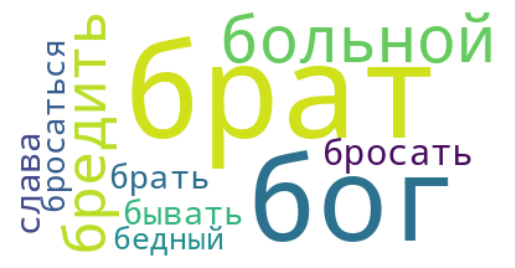

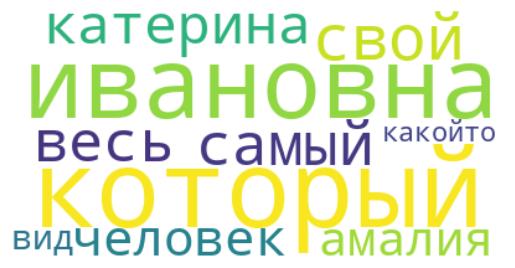

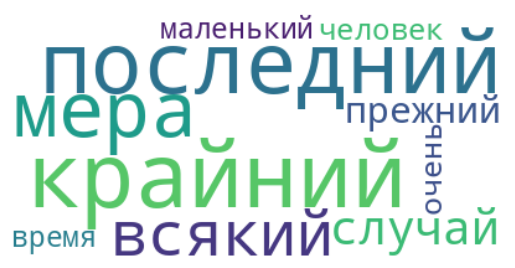

In [154]:


def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=2)
create_wordcloud(topic_model, topic=3)
create_wordcloud(topic_model, topic=4)

ы)

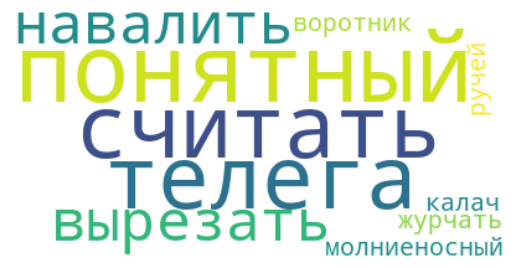

In [155]:
create_wordcloud(topic_model, topic=71)

ХМХМ.... Ну, смысл в этом есть

Давайте теперь обучим еще 2 модельки и посмотрим, что там у них(те же параметры, различие только в метриках расстояния для HDBSCAN'а), выполним те же действия, а в третей части порисуем немножечько(опустим только пробс и топикс, тк .get_topics() полно реализует функционал всего этого)
Начнем с косинусного расстояния

In [156]:
topic_model2= BERTopic(
        embedding_model=emb_model,
        umap_model=umap_model,
        hdbscan_model=hdbscan_manhattan,
        ctfidf_model=ctfidf_model,
        verbose=True   
        
)
topics2, probs2 = topic_model2.fit_transform(data['sentence'])

2024-08-01 02:14:23,845 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 416/416 [02:11<00:00,  3.17it/s]
2024-08-01 02:16:37,853 - BERTopic - Embedding - Completed ✓
2024-08-01 02:16:37,854 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-08-01 02:16:44,177 - BERTopic - Dimensionality - Completed ✓
2024-08-01 02:16:44,178 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-08-01 02:16:44,660 - BERTopic - Cluster - Completed ✓
2024-08-01 02:16:44,664 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-08-01 02:16:44,805 - BERTopic - Representation - Completed ✓


In [157]:
topic_model2.get_topics()

{-1: [('весь', 0.006243984197347914),
  ('сказать', 0.005848912289185773),
  ('говорить', 0.005758980987849856),
  ('рука', 0.005657268016279252),
  ('голова', 0.005552200002163802),
  ('становиться', 0.005443974345270109),
  ('соня', 0.0054234594694645135),
  ('глаз', 0.005376711750322185),
  ('свой', 0.005351333027121061),
  ('мочь', 0.005304533369989592)],
 0: [('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05)],
 1: [('порфирий', 0.06457907354649656),
  ('семеновна', 0.046234077005343585),
  ('софья', 0.046031404997690636),
  ('марфа', 0.04226890785128807),
  ('петровна', 0.040388732822200256),
  ('прокофьич', 0.020248040226209626),
  ('дмитрий', 0.019605048209891854),
  ('петрович', 0.019472727860590632),
  ('сконфузиться', 0.013360982229878898),
  ('офицер', 0.012379654744230051)],
 2: [('бог', 0.056353752280483387),
  ('брат', 0.05462473110774033),
  ('беспокоиться', 0.033043516488924

Заметим, что классов меньше
Давайте повыводим какие нибудь вордклауды и поглядим, что там как там

Сразу можно сказать, что они заполненней

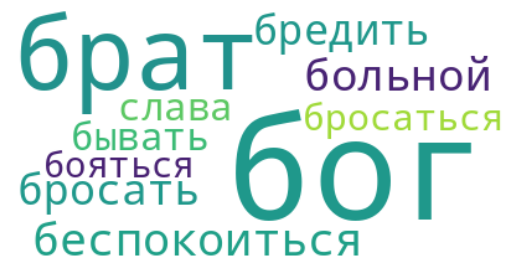

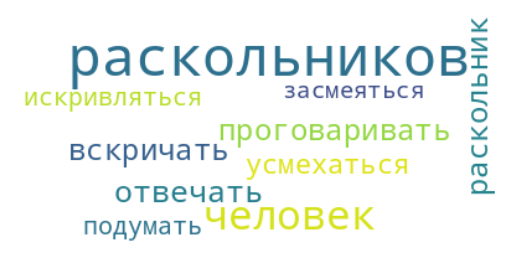

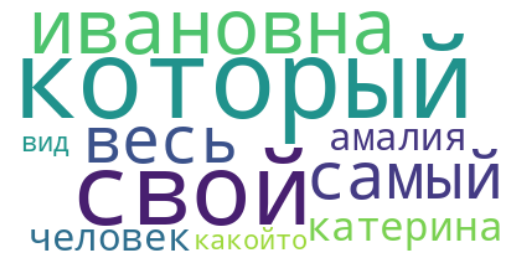

In [158]:
create_wordcloud(topic_model2, topic=2)
create_wordcloud(topic_model2, topic=3)
create_wordcloud(topic_model2, topic=4)


Для третей модельки используем расстояние чебышева, тк оно считается 3м основным помимо L1 и L2

In [159]:
topic_model3= BERTopic(
        embedding_model=emb_model,
        umap_model=umap_model,
        hdbscan_model=hdbscan_chebyshev,
        ctfidf_model=ctfidf_model,
        verbose=True   
        
)
topics3, probs3 = topic_model3.fit_transform(data['sentence'])

2024-08-01 02:16:45,379 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 416/416 [01:27<00:00,  4.73it/s]
2024-08-01 02:18:15,510 - BERTopic - Embedding - Completed ✓
2024-08-01 02:18:15,511 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-08-01 02:18:20,522 - BERTopic - Dimensionality - Completed ✓
2024-08-01 02:18:20,523 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-08-01 02:18:20,891 - BERTopic - Cluster - Completed ✓
2024-08-01 02:18:20,895 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-08-01 02:18:21,032 - BERTopic - Representation - Completed ✓


In [160]:
topic_model3.get_topics()

{-1: [('весь', 0.0070872704404124),
  ('мочь', 0.006738868124774651),
  ('свой', 0.006368391538473495),
  ('сказать', 0.006360788240959488),
  ('становиться', 0.006039123823093907),
  ('рука', 0.005959792862401417),
  ('говорить', 0.005940003980950387),
  ('голова', 0.005848840601413569),
  ('раскольников', 0.005761878681449926),
  ('дело', 0.005676123743615921)],
 0: [('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05)],
 1: [('порфирий', 0.06328825036650657),
  ('семеновна', 0.052151644729721815),
  ('софья', 0.05196186188698767),
  ('марфа', 0.04855850013397623),
  ('петровна', 0.0464125953498932),
  ('прокофьич', 0.022559676477182523),
  ('дмитрий', 0.02186603334644615),
  ('петрович', 0.02070270287574863),
  ('сконфузиться', 0.014785748761022875),
  ('офицер', 0.013729702979273853)],
 2: [('шаг', 0.05289131412339413),
  ('шляпа', 0.02090613390045978),
  ('штука', 0.01973239279872135),
  

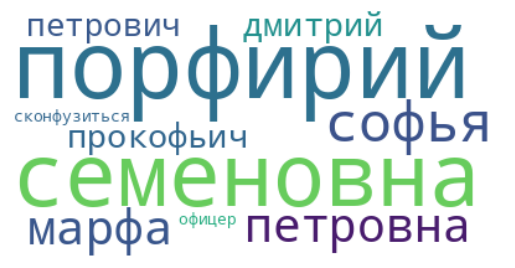

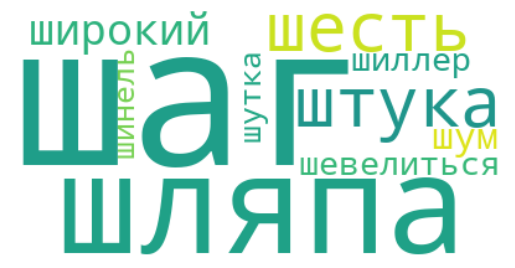

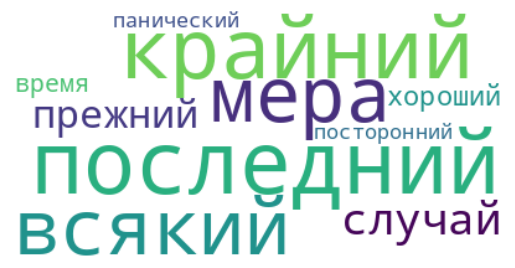

In [161]:
create_wordcloud(topic_model3, topic=1)
create_wordcloud(topic_model3, topic=2)
create_wordcloud(topic_model3, topic=4)

Давайте попробуем посчитать когерентность при помощи модуля gensim

(Когерентность - целостность и связность текста в темах)

In [162]:
from bertopic import BERTopic
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary

In [163]:
def calculate_coherence_score(data, topic_model, coherence='c_v'):
    topic_words = []
    for topic in set(topics):
        try:
            if topic != -1:
                words = topic_model.get_topic(topic)[:5]
                topic_words.append([word for word, _ in words])
        except Exception:
            pass

    dictionary = Dictionary(topic_words)

    coherence_model = CoherenceModel(topics=topic_words, texts=topic_words, dictionary=dictionary, coherence=coherence)
    coherence_score = coherence_model.get_coherence()

    return coherence_score

In [164]:
print(calculate_coherence_score(data['sentence'], topic_model))


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

0.9968284034149372


In [165]:
print(calculate_coherence_score(data['sentence'], topic_model2))


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

0.9976377092001752


In [166]:
print(calculate_coherence_score(data['sentence'], topic_model3))

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

0.9963102555894713


Заметим, что все работает +- нормально(по крайней мере скоры близятся к единичке), но выдвинем гипотезу по моделькам, ранжируем по этой метрике расстояния от лучшего к худшему

1)Манхеттенское(вторая модель)

2)Чебышева(третья модель)

3)Евклидово(первая модель)

Посчитаем еще метрики. Возьмем как основную Коэффициент Калински-Харабаса (оценивает соотношение внутрикластерной дисперсии и межкластерной дистанции.)

In [167]:

from sklearn.metrics import calinski_harabasz_score, silhouette_score
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
from sentence_transformers import SentenceTransformer


In [168]:
trans = SentenceTransformer('ai-forever/sbert_large_nlu_ru')
X = trans.encode(data['sentence'])


In [169]:
from sklearn.decomposition import PCA

# PCA для уменьшения размерности
pca = PCA(n_components=2)
reduced_document_vectors = pca.fit_transform(X)

calinski_harabasz = calinski_harabasz_score(reduced_document_vectors, topics)
print(f"""1 model{calinski_harabasz_score(reduced_document_vectors, topics)}
2 model{calinski_harabasz_score(reduced_document_vectors, topics2)}
3 model{calinski_harabasz_score(reduced_document_vectors, topics3)}""")

1 model156.60569075833587
2 model151.78262162420967
3 model160.69480056452923


Забавно, что тут выделяется третья модель( расстояние чебышева) => классы сгруппированы плотнее и расстояние между ними больше в случае использования манхеттенского расстояния. Также заметим, что значения метрики для такого количества топиков получены весьма хорошие

Рассчитаем коэффициент силуэта(измеряет, насколько хорошо объекты сгруппированы в свои кластеры)


In [170]:
print(f"""1 model {silhouette_score(reduced_document_vectors, topics)}
2 model {silhouette_score(reduced_document_vectors, topics2)}
3 model{ silhouette_score(reduced_document_vectors, topics3)}""")

1 model -0.38779863715171814
2 model -0.3851437270641327
3 model-0.3872251808643341


Эти метрики получились очень странные... Но тут лидирует Манхеттенское расстояние

Очень интересно замечать это и понимать, что разные требования = разные расстояния и нет смысла гнаться за всем сразу вместо того, чтобы делать упор на что-то одно

# Часть 3(что такое хорошо, а что такое плохо?)

Давайте порисуем

для начала визуализируем все топики, посмотрим как у нас все кластеризировалось

In [171]:
topic_model.visualize_documents(data['sentence'])


In [172]:
topic_model2.visualize_documents(data['sentence'])


In [173]:
topic_model3.visualize_documents(data['sentence'])


Окей, моделька работает хорошо, все кластеризует, давайте сделаем какие нибудь выводы по графикам:

1 ) Заметим, что все модельки справились +- одинаково, где-то больше классов, где-то меньше. Очень хорошо, что они не пересекаются

2) Некоторые персонажи соотнесены с глаголами, которые их описывают. Так, например, получился тема Разумихин_смех_раздаваться(а если вспомнить произведение, разумихин был человеком, который стремился всем помочь и почти все время находился в воодушевлении и позитивном состоянии) или же дуня_двинуться_дрыхнуть, что подчеркивает ее как робкого персонажа, с которым обращались не так, как надо было(опять же, подтверждается прочтением произведения)

3)заметим, что из-за разных расстояний количество тем разнится, но также нужно сказать, что оно никак не может интерпретироваться как оценка качества модели

4)Очень много тем, охарактериззованных глаголами. При этом по смыслу они совпадают. Но больше всего в этом плане отличилась модель с расстоянием Чернышевского

5)в класс 0 были отнесены те слова, которые не могут определиться к теме однозначно. Очень интересно было там заметить Раскольникова - показатель того, что он встречается почти везде как Главный герой и не может быть определен к чему-либо


Продолжим анализ и посмотрим на другие графики

In [174]:
topic_model.visualize_heatmap()


In [175]:
topic_model2.visualize_heatmap()


In [176]:
topic_model3.visualize_heatmap()

Заметим, что различий мало, но они есть. 

Рисуем дальше

In [177]:
topic_model.visualize_barchart()


In [178]:
topic_model2.visualize_barchart()


In [179]:
topic_model3.visualize_barchart()


Топ 7 тем каждой модели. Заметим, что есть очень странные темы, которые не сильно относятся к тексту, но также есть топик 2.3(второй в третей модели),1.2, 3.1  с персонажами, также ткждая модель выбрала разные глаголы для топ топиков(5.2, 7.3, 1.1) Все они характеризуют околократкий сюжет произведения(по крайней мере их можно так интерпретировать)
Заметим, что также иногда модельки заносит и они соотносят слова начинающиеся одинаково как слова одной темы

# Часть 4(свободная тема)
Давайте еще что-нибудь обучим. Начнем с того, что удалим глаголы

In [180]:
morph = pymorphy2.MorphAnalyzer(lang='ru')
data['sentence'] = data['sentence'].apply(lambda x: [i for i in x.split() if  pos(i, morph) != 'VERB' and pos(i, morph) != 'INFN'])
data

,sentence
0,"[часть, первый, начало, июль, чрезвычайно, жар..."
1,"[благополучно, встреча, свой, хозяйка, лестница]"
2,"[каморка, кровля, высокий, пятиэтажный, дом, ш..."
3,"[квартирный, хозяйка, который, каморка, обед, ..."
4,"[каждый, молодой, человек, какойто, болезненны..."
...,...
13293,"[счастливый, свой, счастие]"
13294,"[семь, год, семь, год]"
13295,"[начало, свой, счастие, иной, мгновение, оба, ..."
13296,"[новый, жизнь, даром, дорого, великий, будущее..."


In [181]:
data['sentence'] = data['sentence'].apply(' '.join)

Обучим модельку на этом(какую нибудь интересную. Пусть будет чебышев)

In [182]:
topic_model_noun= BERTopic(
        embedding_model=emb_model,
        umap_model=umap_model,
        hdbscan_model=hdbscan_chebyshev,
        ctfidf_model=ctfidf_model,
        
)
topics_noun, probs_noun = topic_model_noun.fit_transform(data['sentence'])

In [183]:
topic_model_noun.visualize_barchart()


Хмхмхм, теперь у нас вылезли топики с фамилиями Нарисуем график всех тем

In [184]:
topic_model_noun.visualize_documents(data['sentence'])


Тем стало больше. Они стали осмысленней. Появились очень хорошо иллюстрирующие темы такие как улица_убийца_убивец, старуха_силач_сычиха, лужин_обиженный_уход(иллюстрация персонажа), раскольников_резко_азарт, преступление_вопрос_толпа, свидригайлов_улыбка_полнота(характеристика персонажа), очень_обморок_отчаяние. Кластеры конечно местами перемешиваются, но результат весьма интересен. информация в 12 кластере, к примеру, очень скомпонована



Посчитаем силуэт и калински харабаш

In [185]:
topics_noun

[-1,
 9,
 4,
 -1,
 2,
 107,
 -1,
 -1,
 -1,
 2,
 107,
 -1,
 -1,
 84,
 108,
 -1,
 4,
 -1,
 -1,
 7,
 0,
 8,
 -1,
 116,
 -1,
 -1,
 11,
 -1,
 -1,
 11,
 -1,
 -1,
 9,
 -1,
 7,
 9,
 25,
 7,
 -1,
 0,
 2,
 18,
 11,
 4,
 1,
 1,
 4,
 22,
 -1,
 -1,
 4,
 -1,
 -1,
 22,
 55,
 -1,
 9,
 -1,
 2,
 -1,
 -1,
 34,
 -1,
 -1,
 -1,
 30,
 -1,
 8,
 -1,
 40,
 -1,
 -1,
 -1,
 5,
 -1,
 -1,
 101,
 1,
 -1,
 5,
 -1,
 -1,
 -1,
 9,
 15,
 -1,
 -1,
 -1,
 -1,
 -1,
 87,
 -1,
 2,
 7,
 -1,
 -1,
 12,
 -1,
 15,
 -1,
 67,
 -1,
 47,
 8,
 6,
 15,
 -1,
 -1,
 15,
 0,
 -1,
 14,
 -1,
 -1,
 2,
 4,
 -1,
 -1,
 -1,
 -1,
 36,
 0,
 0,
 36,
 124,
 -1,
 -1,
 89,
 12,
 75,
 89,
 61,
 0,
 14,
 2,
 2,
 9,
 10,
 22,
 8,
 -1,
 1,
 1,
 1,
 7,
 -1,
 -1,
 9,
 -1,
 5,
 -1,
 1,
 -1,
 -1,
 86,
 -1,
 -1,
 1,
 -1,
 8,
 7,
 16,
 25,
 15,
 36,
 16,
 -1,
 15,
 -1,
 7,
 1,
 -1,
 1,
 -1,
 -1,
 5,
 1,
 -1,
 5,
 -1,
 45,
 -1,
 -1,
 -1,
 40,
 11,
 -1,
 -1,
 1,
 5,
 -1,
 -1,
 0,
 -1,
 -1,
 10,
 15,
 1,
 9,
 -1,
 -1,
 13,
 7,
 -1,
 -1,
 2,
 -1,
 2,
 16,
 1,
 0,
 -1,


In [188]:
from sklearn.decomposition import PCA
X = trans.encode(data['sentence'])
# PCA для уменьшения размерности
pca = PCA(n_components=2)
reduced_document_vectors = pca.fit_transform(X)

print(silhouette_score(reduced_document_vectors, topics_noun))
print(calinski_harabasz_score(reduced_document_vectors, topics_noun))

-0.2638548
392.5245938671499


Метрики стали сильно лучше, забавно...


Давайте теперь нарежем файлик по другому. По частям, например и посмотрим как моделька будет вести себя в таком случае

In [ ]:
with open('Crime And Punishment.txt', 'r', encoding='utf-8') as file:
    text = file.read().replace('I', '').replace('V', '')


    parts = text.split('Часть')
new_data = pd.DataFrame({'sentence': parts})
new_data

,sentence
0,\n\n
1,"первая\n\n\n\n\n\n\n\n\n\nВ начале июля, в чр..."
2,вторая\n\n\n\n\n\n\n\n\n\nТак пролежал он оче...
3,третья\n\n\n\n\n\n\n\n\n\nРаскольников припод...
4,четвертая\n\n\n\n\n\n\n\n\n\n«Неужели это про...
5,"пятая\n\n\n\n\n\n\n\n\n\nУтро, последовавшее ..."
6,шестая\n\n\n\n\n\n\n\n\n\nДля Раскольникова н...


Обработаем новые данные также, как обрабатывали до этого другой датафрейм

In [ ]:
new_data = stop_words_cleaning(new_data)
new_data['sentence'] = new_data['sentence'].apply(lambda x:preprocess_text(''.join(x)))
new_data

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ivzarru/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,sentence
0,
1,первый начало июль чрезвычайно жаркий время ве...
2,второй пролеживать очень долго случаться просы...
3,третий раскольников приподниматься садиться ди...
4,четвертый продолжение сон подуматься раскольни...
5,пятый утро последовать роковой петр петрович о...
6,шестой раскольников наступать странный время т...


Маловат датафрейм:)

Учим модельку, интересно

In [ ]:
topic_model_chapter= BERTopic(
        embedding_model=emb_model,
        umap_model=umap_model,
        hdbscan_model=hdbscan_chebyshev,
        ctfidf_model=ctfidf_model,
        
)
topics_noun, probs_noun = topic_model_chapter.fit_transform(new_data['sentence'])

5 секунд? забавно

In [ ]:
topic_model_chapter.visualize_documents(new_data['sentence'])


Так... А топики будут?

In [ ]:
topic_model_chapter.get_topics()

{-1: [('весь', 0.05657443508304524),
  ('мочь', 0.04197232155870462),
  ('раскольников', 0.04086274983002559),
  ('свой', 0.03770161457124276),
  ('знать', 0.03650583587724361),
  ('сказать', 0.03250647654593137),
  ('говорить', 0.03207436460639122),
  ('человек', 0.030327990423717432),
  ('становиться', 0.029097559078006863),
  ('который', 0.026995403383067416)]}

Ну, наглядно поняли, что по частям оно нормально не делится...

Давайте поделим по главам:))))))

In [ ]:
with open('Crime And Punishment.txt', 'r', encoding='utf-8') as file:
    text = file.read().replace('I', '$$$').replace('V', '$$$')


    parts = text.split('$$$')
hehe = pd.DataFrame({'sentence': parts}) #надоело нормально называть переменные. Я играюсь.
hehe

,sentence
0,\n\nЧасть первая\n\n\n\n\n
1,"\n\n\n\n\nВ начале июля, в чрезвычайно жаркое ..."
2,
3,"\n\n\n\n\nРаскольников не привык к толпе и, ка..."
4,
...,...
77,
78,"\n\n\n\n\nКогда он вошел к Соне, уже начиналис..."
79,"\n\n\n\n\nСибирь. На берегу широкой, пустынной..."
80,


Выполним предобработку

In [ ]:
hehe = stop_words_cleaning(hehe)
hehe['sentence'] = hehe['sentence'].apply(lambda x:preprocess_text(''.join(x)))
hehe

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ivzarru/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,sentence
0,часть первый
1,начало июль чрезвычайно жаркий время вечер мол...
2,
3,раскольников привыкать толпа сказать бежать вс...
4,
...,...
77,
78,входить соня начинаться сумерки весь день соня...
79,сибирь берег широкий пустынный река стоять гор...
80,


Будем учить модельку(данные красивыми делать не особо горю желанием, тк по идее пробелы в них не сильно повлияют на общее представление)

In [ ]:
topic_model_hehe= BERTopic(
        embedding_model=emb_model,
        umap_model=umap_model,
        hdbscan_model=hdbscan_chebyshev,
        ctfidf_model=ctfidf_model,
        
)
topics_hehe, probs_hehe = topic_model_hehe.fit_transform(hehe['sentence'])

7 секунд обучения и вот она, убийца всего(особенно женщин пожилого возраста)

In [ ]:
topic_model_hehe.get_topics()

{0: [('весь', 0.04263519275813197),
  ('мочь', 0.0323854284589323),
  ('раскольников', 0.031590087800473385),
  ('свой', 0.029310566434924218),
  ('знать', 0.028442909455163333),
  ('сказать', 0.025518781050452716),
  ('говорить', 0.025200744196868845),
  ('человек', 0.023911106647313857),
  ('становиться', 0.022998264946471517),
  ('который', 0.021430421026291325)],
 1: [('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05)],
 2: [('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05)]}

In [ ]:
topics_hehe

[0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 2,
 0,
 2,
 2,
 0,
 2,
 0,
 0,
 2,
 0,
 2,
 2,
 0,
 0,
 2,
 0,
 1,
 1,
 0,
 2,
 0,
 0,
 1,
 0,
 0,
 2,
 0,
 2,
 2,
 0,
 2,
 0,
 0,
 2,
 0,
 0,
 2,
 0,
 2,
 2,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 2,
 0]

Хммм, ладно, а если немного поиграться с гиперпараметрами UMAP и взять другой алгоритм кластеризации, подходящий для меньшего датасета(ХДБСКАН хорош для больших, а тут у нас мало данных) возьмем K-means

In [ ]:
from sklearn.cluster import KMeans


In [ ]:
umap_model_hehe = UMAP(n_neighbors=5, n_components=3, metric='cosine')
cluster_model = KMeans(n_clusters=10)

In [ ]:
topic_model_hehe= BERTopic(
        embedding_model=emb_model,
        umap_model=umap_model_hehe,
        hdbscan_model=cluster_model,
        ctfidf_model=ctfidf_model,
        
)
topics_hehe, probs_hehe = topic_model_hehe.fit_transform(hehe['sentence'])

In [ ]:
topic_model_hehe.get_topics()

{0: [('ивановна', 0.030601076324482546),
  ('весь', 0.024485879726349902),
  ('катерина', 0.023876164298811623),
  ('свой', 0.02307365469551173),
  ('мочь', 0.021979141702536693),
  ('знать', 0.019757366416004694),
  ('соня', 0.01817648239804734),
  ('говорить', 0.017023929818455668),
  ('раскольников', 0.016772906646042418),
  ('который', 0.01637788938605741)],
 1: [('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05)],
 2: [('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05)],
 3: [('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05),
  ('', 1e-05)],
 4: [('весь', 0.0321810915322706),
  ('порфирий', 0.028191409830652228),
  ('мочь', 0.02453889666986463),
  ('раскольников', 0.023164974210944756),
  ('знать', 0.02295085074

Есть контакт, беглый просмотр глазами говорит, что эти кластеры будут скорее отражать взаимодействие между персонажами. Посмотрим:

In [ ]:
topic_model_hehe.visualize_documents(hehe['sentence'])


Забавно, что все хоть что-то значащие классы разместились в одной четверти и глобально все главы поделились относительно взаимодействия персонажей в них.

# Выводы

1)HDBSCAN действительно хорош с большими датасетами, на маленьких он молчит

2)От расстояния очень сильно зависит работа алгоритма и темы, но визуально кластеры получились различимы для всех расстояний и результаты весьма приемлемы

3)Датасет лучше делать больше, чтобы модель работала лучше, искала больше тем и определяла их точнее, а не как куча чего-то непонятного\пустые координатные оси


+ выводы после 3й части

# Часть 5(Bonus)

познакомимся с альтернативами для Bertopic, потрогаем LSI и сравним его с BERTopic моделью. Работать будем с нашей прекрасной data из основного задания

In [ ]:
lsi_data = data['sentence'].apply(lambda x: word_tokenize(x))

In [ ]:
from gensim import corpora, models, similarities


Создадим словарь слов

In [ ]:
dictionary = corpora.Dictionary(lsi_data)
dictionary

Создадим корпус текстов и TF-IDF модельку на нем

In [ ]:
corpus = [dictionary.doc2bow(text) for text in lsi_data]
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]

Теперь поиграемся с LSIModel

In [ ]:
lsi_model = models.LsiModel(corpus_tfidf, id2word=dictionary)

Поглядим, какие же там темы она нашла

In [ ]:
topics = lsi_model.print_topics(num_topics=10)
for topic in topics:
    print(topic)

(0, '0.904*"раскольников" + 0.203*"мочь" + 0.157*"соня" + 0.146*"весь" + 0.134*"разумихин" + 0.072*"рука" + 0.062*"свой" + 0.060*"минута" + 0.059*"глаз" + 0.055*"порфирий"')
(1, '-0.749*"мочь" + -0.380*"соня" + 0.372*"раскольников" + -0.210*"весь" + -0.147*"разумихин" + -0.080*"человек" + -0.076*"очень" + -0.072*"дело" + -0.069*"рука" + -0.066*"свой"')
(2, '-0.886*"соня" + 0.441*"мочь" + 0.067*"разумихин" + -0.040*"ивановна" + 0.040*"раскольников" + -0.039*"катерина" + -0.037*"рука" + 0.035*"весь" + 0.028*"человек" + 0.016*"время"')
(3, '-0.900*"разумихин" + 0.307*"мочь" + -0.150*"весь" + 0.129*"раскольников" + 0.084*"соня" + -0.079*"рука" + -0.069*"господин" + -0.053*"порфирий" + -0.047*"дверь" + -0.044*"дело"')
(4, '-0.760*"весь" + 0.331*"разумихин" + 0.289*"мочь" + -0.183*"дело" + 0.140*"соня" + -0.108*"свой" + 0.104*"раскольников" + -0.094*"время" + -0.092*"петрович" + -0.091*"самый"')
(5, '0.507*"весь" + -0.485*"дело" + -0.283*"петрович" + -0.252*"порфирий" + -0.232*"дуня" + -0.19

Темы, однако, не воодушевляют

Создадим матрицу подобия и попробуем поиграться с запросами к модельке

In [ ]:
index = similarities.MatrixSimilarity(lsi_model[corpus])


In [ ]:
query_bow = dictionary.doc2bow('Тварь я дрожащая иль право имею?'.lower().split())
query_lsi = lsi_model[query_bow]
similar = index[query_lsi]
print(sorted(list(enumerate(similar)), key=lambda x: x[1], reverse=True))


[(9958, 1.0), (873, 0.9968728), (1019, 0.9968728), (6829, 0.9968728), (7127, 0.9968728), (7974, 0.9968728), (9678, 0.9968728), (9959, 0.9968728), (10471, 0.9968728), (10778, 0.9968728), (10878, 0.9968728), (8101, 0.9968204), (11313, 0.99659467), (8070, 0.99658906), (4861, 0.9897158), (9945, 0.9895997), (5205, 0.98883307), (9944, 0.9875299), (6651, 0.98572886), (8727, 0.97713256), (6584, 0.97526556), (6730, 0.9722285), (1033, 0.96606505), (12453, 0.9610691), (2703, 0.93804437), (8737, 0.8914871), (8863, 0.8024868), (6068, 0.7945541), (6086, 0.7875606), (6105, 0.72497654), (4902, 0.7182906), (6110, 0.717981), (11409, 0.7134564), (7129, 0.7121749), (3814, 0.71052396), (6073, 0.70816445), (2564, 0.7065262), (5732, 0.7040815), (5319, 0.7022068), (6659, 0.70213085), (9846, 0.7017976), (4942, 0.6951283), (11493, 0.67372555), (5086, 0.6678728), (6090, 0.65861), (6074, 0.65199846), (4967, 0.6477267), (4973, 0.6401832), (6613, 0.61112857), (10983, 0.60025513), (4479, 0.58384496), (12740, 0.57952

Выведем эти потрясающие предложения, посмотрим, на что похож наш запрос

In [ ]:
print(data['sentence'][9958])
print(data['sentence'][11313])
print(data['sentence'][873])

тварь право
право новенький
право


Ну.... Какие выводы можно сделать: кластеризация через LSI хоть и работает, но очень странно. Не удивительно, алгоритм больше про поиск похожих. Зато забавно написать свой поисковик по преступлению и наказанию:)

Пусть практического смысла в этом мало, интересный опыт бонусной работы

Ну и раз такая пьянка, посмотрим, что найдет NMF c TF-IDF

In [ ]:
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer


In [ ]:
vectorizer = TfidfVectorizer()
nmf_data = vectorizer.fit_transform(data['sentence'])


In [ ]:
NMF_model = NMF(n_components=4, random_state=1)
W = NMF_model.fit_transform(nmf_data)
H = NMF_model.components_

In [ ]:
def show_topics(H, W, feature_names, n_top_words=10):
    for topic_idx, topic in enumerate(H):
        print(f"Тема {topic_idx + 1}:")
        print(" ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))
        print()

In [ ]:
show_topics(H, W, vectorizer.get_feature_names_out())


Тема 1:
раскольников глаз минута порфирий свой рука лицо дверь комната диван

Тема 2:
мочь человек очень свой случай ваш время действительно романовна авдотья

Тема 3:
соня рука ивановна катерина чтото свой очень голова дверь испуг

Тема 4:
весь разумихин дело свой рука время человек порфирий петрович очень



Забавно конечно, но из-за повторов слов получается что-то странное. Давайте создадим облако слов посмотреть, что за ужас здесь творится

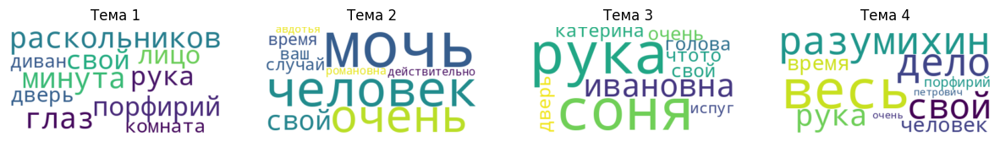

In [ ]:
def plot_word_clouds(H, feature_names, n_top_words=10):
    fig, axes = plt.subplots(1, H.shape[0], figsize=(15, 5), sharex=True, sharey=True)
    for topic_idx, topic in enumerate(H):
        wordcloud = WordCloud(
            background_color='white',
            max_words=n_top_words,
            contour_color='steelblue'
        ).generate(" ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))
        axes[topic_idx].imshow(wordcloud, interpolation='bilinear')
        axes[topic_idx].set_title(f"Тема {topic_idx + 1}")
        axes[topic_idx].axis('off')
    plt.show()

plot_word_clouds(H, vectorizer.get_feature_names_out())

Из-за отображения размера слов относительно их "веса" в данной теме становится попонятней

Потыкались, интересно, преимущества BERTopic неоспоримы, тк интерпретация гораздо лучше и стало понятней, почему в задаче просили делать именно его